# Codecademy Portfolio Project: "OKCupid Date-A-Scientist"
Project Author: Alexander Lacson

# !Behind the Scenes!

This article is a behind the scenes look at the inspection, cleaning, processing, analysis, interpretation, and modelling of the data. It is geared more towards a techincal audience. If you want to see a user-friendly summary, there is a separate article here (**Work in Progress**). View this project's readme for reproducibility information.

# Project Description

In this project, I will work with data from OKCupid, an online dating app. This dataset was provided to me by Codecademy as part of their "Data Science Career Path". In this project I seek to accomplish the following:
- Visualize and explore OKCupid user data.<br> _"Who uses OKCupid? What do people usually share on their profiles? How do people describe themselves?"_
- Use Machine Learning to predict gender.<br> _"If a user's gender was kept hidden, can the other pieces of information be used to correctly predict the gender? If yes, what information was most important for making the prediction?"_
- Use Unsupervised Machine Learning to create a simple dating recommendation algorithm.<br> _"Can we recommend who you should date?"_

Let's begin with inspection of the data.

# Inspection

In [1]:
import pandas as pd
df = pd.read_csv('profiles.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   body_type    54650 non-null  object 
 2   diet         35551 non-null  object 
 3   drinks       56961 non-null  object 
 4   drugs        45866 non-null  object 
 5   education    53318 non-null  object 
 6   essay0       54458 non-null  object 
 7   essay1       52374 non-null  object 
 8   essay2       50308 non-null  object 
 9   essay3       48470 non-null  object 
 10  essay4       49409 non-null  object 
 11  essay5       49096 non-null  object 
 12  essay6       46175 non-null  object 
 13  essay7       47495 non-null  object 
 14  essay8       40721 non-null  object 
 15  essay9       47343 non-null  object 
 16  ethnicity    54266 non-null  object 
 17  height       59943 non-null  float64
 18  income       59946 non-null  int64  
 19  job 

- The sample size is 59,946
- There are 30 features to describe each user. Only three of the features are Numeric, the rest are categorical or in text form. 
- Not all users have complete data.

Let's see how these feature values actually look like:

In [2]:
pd.set_option("display.max_columns", None)
df.head()

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status
0,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single
1,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories.<br /...,NaN,NaN,i am very open and will share just about anyth...,NaN,white,70.0,80000,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single
2,38,thin,anything,socially,NaN,graduated from masters program,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement<br />\nconversation<br />\ncreation<b...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ...",NaN,68.0,-1,NaN,2012-06-27-09-10,"san francisco, california",NaN,straight,has cats,NaN,m,pisces but it doesn&rsquo;t matter,no,"english, french, c++",available
3,23,thin,vegetarian,socially,NaN,working on college/university,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . .<br />\nlynch, j...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.,white,71.0,20000,student,2012-06-28-14-22,"berkeley, california",doesn&rsquo;t want kids,straight,likes cats,NaN,m,pisces,no,"english, german (poorly)",single
4,29,athletic,NaN,socially,never,graduated from college/university,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at:<br />\nhttp://bag...,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians<br />\nat the...",NaN,NaN,NaN,NaN,NaN,"asian, black, other",66.0,-1,artistic / musical / writer,2012-06-27-21-26,"san francisco, california",NaN,straight,likes dogs and likes cats,NaN,m,aquarius,no,english,single


- The income column has values of -1 to signify missing values. The other columns make use of NaN.
- I cannot properly see the 'essays' in a tabular display.
- The "last_online" column has values from the year 2012.
- Some of the columns can actually be split up. For example, with the field 'religion', instead of a value being 'agnosticism and very serious about it", we can have {'religion': 'agnosticism'} and {'religion_seriousness': 'very serious about it'}. 

To get a proper idea regarding these essays and columns containing text, let's print out a single user's data.

In [3]:
def show_user_data(df, index):
    '''Takes a row index and prints out all the features of that index'''
    for each, col in zip(df.iloc[index], df.columns):
        print('\033[1m' + col + ':' + '\033[0m' + ' ' + str(each))
show_user_data(df, 0)

age: 22
body_type: a little extra
diet: strictly anything
drinks: socially
drugs: never
education: working on college/university
essay0: about me:<br />
<br />
i would love to think that i was some some kind of intellectual:
either the dumbest smart guy, or the smartest dumb guy. can't say i
can tell the difference. i love to talk about ideas and concepts. i
forge odd metaphors instead of reciting cliches. like the
simularities between a friend of mine's house and an underwater
salt mine. my favorite word is salt by the way (weird choice i
know). to me most things in life are better as metaphors. i seek to
make myself a little better everyday, in some productively lazy
way. got tired of tying my shoes. considered hiring a five year
old, but would probably have to tie both of our shoes... decided to
only wear leather shoes dress shoes.<br />
<br />
about you:<br />
<br />
you love to have really serious, really deep conversations about
really silly stuff. you have to be willing to snap 

- The text data is formatted as HTML. This can be converted to normal text using an HTML Parser and Regex.
- The unstructured text data of the essay questions should probably be analyzed using Natural Language Processing.

To find out how long ago this sample was taken, let's look at the range of values of **last_online**.

In [4]:
print(df.last_online.min())
print(df.last_online.max())

2011-06-27-01-52
2012-07-01-08-57


### "This data is very old. We can only make inference about OKCupid's users during the year 2012!"

Finally, before doing anything to the data, let's see which features have missing values.

Missing values per column
[(0, 'age'), (0, 'income'), (0, 'last_online'), (0, 'location'), (0, 'orientation'), (0, 'sex'), (0, 'status'), (3, 'height'), (50, 'speaks'), (2985, 'drinks'), (5296, 'body_type'), (5488, 'essay0'), (5512, 'smokes'), (5680, 'ethnicity'), (6628, 'education'), (7572, 'essay1'), (8198, 'job'), (9638, 'essay2'), (10537, 'essay4'), (10850, 'essay5'), (11056, 'sign'), (11476, 'essay3'), (12451, 'essay7'), (12603, 'essay9'), (13771, 'essay6'), (14080, 'drugs'), (19225, 'essay8'), (19921, 'pets'), (20226, 'religion'), (24395, 'diet'), (35561, 'offspring')]


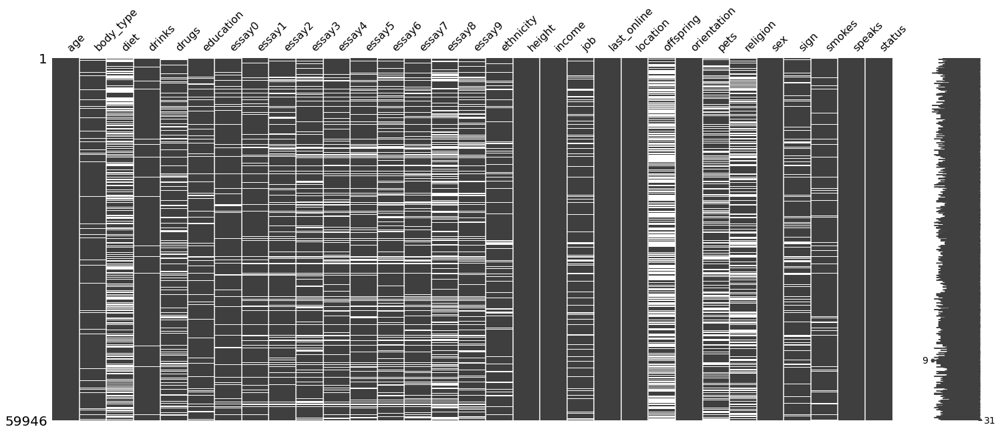

In [5]:
import missingno as msno
msno.matrix(df)
print('Missing values per column')
nulls = [(df[feature].isnull().sum(), feature) for feature in df.columns]
print(sorted(nulls))

- The income column is shown as having no missing values, but in reality it has missing values encoded as "-1".
- Some columns such as age, height, orientation, have no missing values, whereas most of the other columns do have missing values. This means that when a user signs up for OKCupid there are required and optional fields for the user to fill.

## Inspection Recap

In this section we have learned the following:
- The sample size is 59,946
- There are 30 features to describe each user, 3 of which are numeric, the rest are categorical or text
- Users were given Optional and Required fields upon signing up. A lot of users do not supply complete data.
- The income column uses -1 as its placeholder for missing data
- This data sample was collected from the year 2012
- The text data is formatted as HTML
- The essay questions are good candidates for analysis using Natural Language Processing
- Some of the columns can be split up to give us more features

# Cleaning and Tidying

The data has to be cleaned and preprocessed before it can be analyzed. Let's start with replacing the '-1' in the income field with **NaN**, the null value recognized by Pandas and NumPy.

In [6]:
import numpy as np
df.income.replace(-1, np.nan, inplace = True)

We can reinspect the missing values visualization to confirm the replacement of the null values.

Missing values per column
[(0, 'age'), (0, 'last_online'), (0, 'location'), (0, 'orientation'), (0, 'sex'), (0, 'status'), (3, 'height'), (50, 'speaks'), (2985, 'drinks'), (5296, 'body_type'), (5488, 'essay0'), (5512, 'smokes'), (5680, 'ethnicity'), (6628, 'education'), (7572, 'essay1'), (8198, 'job'), (9638, 'essay2'), (10537, 'essay4'), (10850, 'essay5'), (11056, 'sign'), (11476, 'essay3'), (12451, 'essay7'), (12603, 'essay9'), (13771, 'essay6'), (14080, 'drugs'), (19225, 'essay8'), (19921, 'pets'), (20226, 'religion'), (24395, 'diet'), (35561, 'offspring'), (48442, 'income')]


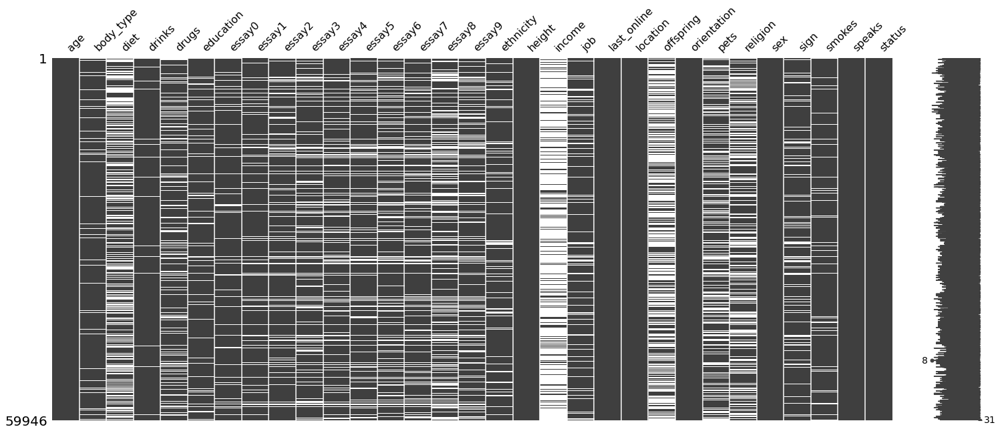

In [7]:
msno.matrix(df)
print('Missing values per column')
nulls = [(df[feature].isnull().sum(), feature) for feature in df.columns]
print(sorted(nulls))

It appears that income is one of the pieces of information that people would least like to share. Later on, we could make a detailed comparison of the percentage of missing values of each column to evaluate "willingness of users to share information".

Let's move on to the HTML formatted text data. Not only is it more difficult to read, it is also not suitable for Natural Language Processing. Let's clean up the text using an HTML Parser and Regex. I will demonstrate the process when applied to a single entry first.

In [8]:
from bs4 import BeautifulSoup
import re

#Create html_parser function
def html_parser(raw_html):
    raw_html = str(raw_html)
    soup = BeautifulSoup(raw_html, 'html.parser')
    soup_string = soup.get_text()
    soup_string = re.sub('<.*>', ' ', soup_string)
    return soup_string

**Before:**

In [9]:
print(df.essay9[0])

you want to be swept off your feet!<br />
you are tired of the norm.<br />
you want to catch a coffee or a bite.<br />
or if you want to talk philosophy.


**After:**

In [10]:
print(html_parser(df.essay9[0]))

you want to be swept off your feet!
you are tired of the norm.
you want to catch a coffee or a bite.
or if you want to talk philosophy.


Now let's apply this to all of the text in the data.

In [11]:
#Takes a few minutes - Parse all the raw HTML in the data

import warnings
warnings.filterwarnings('ignore')

object_cols = [series for series in df.columns if df[series].dtype == 'O']
for series in object_cols:
    df[series] = df[series].apply(lambda row: html_parser(row) if pd.notnull(row) else row)

# warnings.resetwarnings()

Lots of warnings given, mostly because users are including YouTube URLs. It's good to be made aware, as the URLs could affect the anlaysis later.

## Cleaning Recap

In this section, we accomplished the following:
- The -1 values of income have been replaced with NaN, making it consistent with the null placeholders used by the other columns, and recognized by Pandas and NumPy
- All HTML formatted text has been converted to normal, readable text. A caveat though is that it still includes '\n', the carriage return symbol, which is parsed by python when the text is input to the print() function.

# Feature Engineering Part 1

Machine Learning can work better if there are more columns because we're giving it more points of comparison. The addition of more columns, also called features, is feature engineering.

I'm going to back up the dataframe in its current form, so that even after modification and addition of columns, we can easily refer to the original data if necessary.

In [12]:
original_df_backup = df.copy(deep = True)

## Splitting Columns

We can produce new features by splitting the existing ones. Some of our features are actually describing two variables that are potentially independent of each other. Later on, before we develop our model, we will investigate variable codependence by checking Pearson correlations.

### Splitting various columns into two

In [13]:
def two_split_columns(delimiter, df, feature, col1_name, col2_name, swap = False, stringify_None = False, strip = False):
    '''splits a column into two. Takes a delimiter, DataFrame, and Series name'''
    new = df[feature].str.split(delimiter, n = 1, expand = True) 
    if swap:
        new[1] = new.apply(lambda row: row[0] if not(isinstance(row[1], str)) else row[1], axis = 1)
        new[0] = new.apply(lambda row: '[No Prefix]' if row[0] == row[1] else row[0], axis = 1)
    if stringify_None:
        new[1] = new[1].apply(lambda col: 'None' if col is None else col)
        new[0] = new[0].apply(lambda col: 'None' if col is None else col)
    if strip:
        new[1] = new[1].apply(lambda col: col.strip() if isinstance(col, str) else col)
        new[0] = new[0].apply(lambda col: col.strip() if isinstance(col, str) else col)      
    df[col1_name]= new[0] 
    df[col2_name]= new[1]
    return new

two_split_columns(" ", df, "diet", "diet_adherence", "diet_type", True)
two_split_columns(",", df, "location", "city", "state/country")
two_split_columns(",", df, "offspring", "offspring_want", "offspring_attitude", False, False)
##Religion
df['temp'] = df['religion'].apply(lambda col: col.replace("but", "and") if isinstance(col, str) else col)
two_split_columns("and", df, "temp", "religion_type", "religion_attitude", stringify_None = True, strip = True)
del df['temp']
## Sign
df['temp'] = df['sign'].apply(lambda col: col.replace("but", "and") if isinstance(col, str) else col)
two_split_columns("and", df, "temp", "sign_type", "sign_attitude", stringify_None = True, strip = True)
del df['temp']

Columns split in two:

| Original Feature        | New Feature 1      | New Feature 2|
| :------------- | :---------- | :---------- |
| diet | diet_adherence| diet_type|
| location | city| state|
| offspring | offspring_want| offspring_attitude|
| religion | religion_type| religion_attitude|
| sign | sign_type| sign_attitude|

### Splitting 'pets'

There are really two kinds of pets among the values: dogs and cats. Let's proceed by splitting 'pets' into 'dogs' and 'cats'.

In [14]:
temp = two_split_columns("and", df, "pets", "dogs", "cats", False, False, strip = True)
temp[1] = temp.apply(lambda row: row[0] if "cat" in str(row[0]) else row[1], axis = 1)
temp[0] = temp.apply(lambda row: None if "cat" in str(row[0]) else row[0], axis = 1)
df["dogs"] = temp[0]
df["cats"] = temp[1]

Having a pet can have nothing to do with liking a pet. Let's  further split this into 'dog_preference', 'has_dogs', 'cat_preference', 'has_cats'. Let's also remove 'dogs' and 'cats'.

In [15]:
df['dog_preference'] = df.apply(lambda row: row['dogs'] if "like" in str(row['dogs']) else None, axis = 1)
df['cat_preference'] = df.apply(lambda row: row['cats'] if "like" in str(row['cats']) else None, axis = 1)
df['has_dogs'] =  df.apply(lambda row: 1 if "has" in str(row['dogs']) else 0, axis = 1)
df['has_dogs'] =  df.apply(lambda row: row['has_dogs'] if isinstance(row['pets'], str) else None, axis = 1)
df['has_cats'] =  df.apply(lambda row: 1 if "has" in str(row['cats']) else 0, axis = 1)
df['has_cats'] =  df.apply(lambda row: row['has_cats'] if isinstance(row['pets'], str) else None, axis = 1)
del df['dogs']
del df['cats']

In [16]:
df[['dog_preference', 'has_dogs', 'cat_preference', 'has_cats']].head()

,dog_preference,has_dogs,cat_preference,has_cats
0,likes dogs,0.0,likes cats,0.0
1,likes dogs,0.0,likes cats,0.0
2,None,0.0,None,1.0
3,None,0.0,likes cats,0.0
4,likes dogs,0.0,likes cats,0.0


### Splitting 'speaks'

There's quite some unpacking that needs to be done here. There appear to be several different languages and different options for fluency. Before we start making new columns, let's get a better sense for what exactly our values are.

In [17]:
languages = df.speaks.value_counts()
languages = languages.index
languages = [each.split(',') for each in languages]
languages = [item for sublist in languages for item in sublist]
languages = set([each.strip() for each in languages])
temp = languages
languages = [each.split(" (") for each in languages]
languages = [each[0] for each in languages]
languages = sorted(set(languages))
print("There are {} different language options:".format(len(languages)))
print(languages)
print("There are 4 different fluency options per language:")
print(sorted(temp)[:4])

There are 77 different language options:
['afrikaans', 'albanian', 'ancient greek', 'arabic', 'armenian', 'basque', 'belarusan', 'bengali', 'breton', 'bulgarian', 'c++', 'catalan', 'cebuano', 'chechen', 'chinese', 'croatian', 'czech', 'danish', 'dutch', 'english', 'esperanto', 'estonian', 'farsi', 'finnish', 'french', 'frisian', 'georgian', 'german', 'greek', 'gujarati', 'hawaiian', 'hebrew', 'hindi', 'hungarian', 'icelandic', 'ilongo', 'indonesian', 'irish', 'italian', 'japanese', 'khmer', 'korean', 'latin', 'latvian', 'lisp', 'lithuanian', 'malay', 'maori', 'mongolian', 'norwegian', 'occitan', 'other', 'persian', 'polish', 'portuguese', 'romanian', 'rotuman', 'russian', 'sanskrit', 'sardinian', 'serbian', 'sign language', 'slovak', 'slovenian', 'spanish', 'swahili', 'swedish', 'tagalog', 'tamil', 'thai', 'tibetan', 'turkish', 'ukrainian', 'urdu', 'vietnamese', 'welsh', 'yiddish']
There are 4 different fluency options per language:
['afrikaans', 'afrikaans (fluently)', 'afrikaans (oka

After isolation of terms it is revealed that among the 'speaks' values there are 77 different languages and four different descriptors of language fluency. The ambiguity of the fluency options presents a dilemma. What is 'afrikaans' supposed to mean compared to 'afrikaans (okay)'? Because of this ambiguity, we will not make use of the fluency descriptors in our visualization. We will create a new column for each language containing a 1 to indicate if the language is spoken, 0 if not. The result is actually called a sparse matrix. 'Sparse' because it contains much more 0s than 1s.

In [18]:
#Takes a few minutes
for language in languages:
    df[language] = df.apply(lambda row: 1 if (language in str(row['speaks'])) else 0, axis = 1)

In [19]:
df[languages].head(3)

,afrikaans,albanian,ancient greek,arabic,armenian,basque,belarusan,bengali,breton,bulgarian,c++,catalan,cebuano,chechen,chinese,croatian,czech,danish,dutch,english,esperanto,estonian,farsi,finnish,french,frisian,georgian,german,greek,gujarati,hawaiian,hebrew,hindi,hungarian,icelandic,ilongo,indonesian,irish,italian,japanese,khmer,korean,latin,latvian,lisp,lithuanian,malay,maori,mongolian,norwegian,occitan,other,persian,polish,portuguese,romanian,rotuman,russian,sanskrit,sardinian,serbian,sign language,slovak,slovenian,spanish,swahili,swedish,tagalog,tamil,thai,tibetan,turkish,ukrainian,urdu,vietnamese,welsh,yiddish
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Print memory usage function. Let's investigate the memory being used up by the sparse matrix.

In [20]:
#Credit where credit is due: Function from Dafni Sidiropoulou Velidou's article "Working with sparse data sets in pandas and sklearn"
BYTES_TO_MB_DIV = 0.000001
def print_memory_usage_of_data_frame(df):
    mem = round(df.memory_usage().sum() * BYTES_TO_MB_DIV, 3) 
    print("Memory usage is " + str(mem) + " MB")
    
print_memory_usage_of_data_frame(df[languages])

Memory usage is 36.927 MB


Converting our sparse matrix to a Pandas Sparse Array reduces its memory usage and allows AI algorithms to take less time training on it.

In [21]:
temp = df[languages].copy()
for (columnName, columnData) in temp.iteritems():
    df[columnName] = pd.arrays.SparseArray(columnData.values, dtype='uint8')

print_memory_usage_of_data_frame(df[languages])

Memory usage is 0.553 MB


## Adding columns

There are other ways to derive new features in addition to splitting.

In [22]:
temp = df['ethnicity'].apply(lambda col: col.split(",") if isinstance(col, str) else col)
df['num_ethnicities'] = temp.apply(lambda col: len(col) if isinstance(col, list) else col)
df['optional_%unfilled'] = ((original_df_backup.isnull().sum(axis = 1))/24) * 100
df['num_languages'] = df[languages].sum(axis = 1).replace(0, None)

Added Columns:

| New Feature        | Description      |
| :------------- | :---------- |
| num_ethnicities |Contains the number of ethnicities listed in 'ethnicity'|
| optional_%unfilled |Percentage of optional fields unfilled|
| num_languages|Count of languages spoken|

## Feature Engineering Part 1 Recap

In this section, we accomplished the following:
- We split the following columns into two:

| Original Feature        | New Feature 1      | New Feature 2|
| :------------- | :---------- | :---------- |
| diet | diet_adherence| diet_type|
| location | city| state|
| offspring | offspring_want| offspring_attitude|
| religion | religion_type| religion_attitude|
| sign | sign_type| sign_attitude|

- We split 'pets' into 'dog_preference', 'has_dogs', 'cat_preference', 'has_cats'
- We expanded 'speaks' into a boolean matrix where each column is a language and each row value is 1 or 0
- We introduced the following additional columns:

| New Feature        | Description      |
| :------------- | :---------- |
| num_ethnicities |Contains the number of ethnicities listed in 'ethnicity'|
| optional_%unfilled |Percentage of optional fields unfilled|
| num_languages|Count of languages spoken|

# Visualization

## Numerical Features

The best way to explore data is to visualize it. Let's start by generating histograms and boxplots of our numerical features.

In [23]:
import plotly.express as px

selection = ['age', 'height', 'income', 'optional_%unfilled']
fig = px.histogram(df, x = selection, marginal = 'box', histnorm = 'percent').update_traces(visible = False, showlegend=False)
fig.data[0].visible = True
fig.data[1].visible = True

def create_button(column):
    temp = []
    for each in selection:
        temp.append(each == column)
        temp.append(each == column)
    return dict(
                args=[{"visible": temp}],
                label=column,
                method="update"
                )

fig.update_layout(
    title = "2012 OKCupid Profiles",
    updatemenus=[
        #Add a dropdown selector
        dict(
            buttons = [create_button(column) for column in selection],
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
        )

    ]
)
fig.show()

Use the dropdown selector to switch between features. Datapoints show more information on mouseover. The graph can be panned and zoomed.

| Feature        | Comment      |
| :------------- | :---------- |
| Age | The median age is 30. The distribution is right-skewed. Most users are young and working adults.|
|  Height        | Most heights range between 59 and 78 in (4.9 - 6.5 ft) with a median of 68in(5.67ft). The distribution appears normal. |
|  Income        | The median income is \\$50k. A quarter of all incomes are $25k. Most income distributions are log-normal (if the ultra-wealthy are not included), and this is no different. |
|All Features Above| From the box plot, we can see that all of the distributions have outliers - There is a 4.5% group of \\$1M earners. There are two people over 100 years old. There is a height of 1in. Below, we will inspect these data points (user profiles) to see what's really going on.|
|optional_%unfilled| The y-axis shows the percentage of users and the x-axis shows the percentage of optional user information fields left unfilled. Interquartile Range is 12% - 30%, meaning half of all users don't bother to fill 12% - 30% of optional fields. A quarter of users are below that range and a quarter of users are above that range. This is a feature that was engineered from the given raw data.|

### Outlier Inspection

#### Age

Let's look a look at the profiles of our centennial users.

In [24]:
display(df.iloc[2512:2513])
display(df.iloc[25324:25325])

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,diet_adherence,diet_type,city,state/country,offspring_want,offspring_attitude,religion_type,religion_attitude,sign_type,sign_attitude,dog_preference,cat_preference,has_dogs,has_cats,afrikaans,albanian,ancient greek,arabic,armenian,basque,belarusan,bengali,breton,bulgarian,c++,catalan,cebuano,chechen,chinese,croatian,czech,danish,dutch,english,esperanto,estonian,farsi,finnish,french,frisian,georgian,german,greek,gujarati,hawaiian,hebrew,hindi,hungarian,icelandic,ilongo,indonesian,irish,italian,japanese,khmer,korean,latin,latvian,lisp,lithuanian,malay,maori,mongolian,norwegian,occitan,other,persian,polish,portuguese,romanian,rotuman,russian,sanskrit,sardinian,serbian,sign language,slovak,slovenian,spanish,swahili,swedish,tagalog,tamil,thai,tibetan,turkish,ukrainian,urdu,vietnamese,welsh,yiddish,num_ethnicities,optional_%unfilled,num_languages
2512,110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.0,NaN,NaN,2012-06-27-22-16,"daly city, california",NaN,straight,NaN,NaN,f,NaN,NaN,english,single,NaN,NaN,daly city,california,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,95.833333,1


,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,diet_adherence,diet_type,city,state/country,offspring_want,offspring_attitude,religion_type,religion_attitude,sign_type,sign_attitude,dog_preference,cat_preference,has_dogs,has_cats,afrikaans,albanian,ancient greek,arabic,armenian,basque,belarusan,bengali,breton,bulgarian,c++,catalan,cebuano,chechen,chinese,croatian,czech,danish,dutch,english,esperanto,estonian,farsi,finnish,french,frisian,georgian,german,greek,gujarati,hawaiian,hebrew,hindi,hungarian,icelandic,ilongo,indonesian,irish,italian,japanese,khmer,korean,latin,latvian,lisp,lithuanian,malay,maori,mongolian,norwegian,occitan,other,persian,polish,portuguese,romanian,rotuman,russian,sanskrit,sardinian,serbian,sign language,slovak,slovenian,spanish,swahili,swedish,tagalog,tamil,thai,tibetan,turkish,ukrainian,urdu,vietnamese,welsh,yiddish,num_ethnicities,optional_%unfilled,num_languages
25324,109,athletic,mostly other,NaN,never,working on masters program,NaN,NaN,NaN,nothing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.0,NaN,student,2012-06-30-18-18,"san francisco, california",might want kids,straight,NaN,other and somewhat serious about it,m,aquarius but it doesn’t matter,when drinking,english (okay),available,mostly,other,san francisco,california,might want kids,None,other,somewhat serious about it,aquarius,it doesn’t matter,None,None,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,54.166667,1


The first one has 95% unfilled optional fields. The second has 54% unfilled optional fields and a height of 95inches(8ft tall). Do you think these profiles are reliable?

#### Height

Below is an example of the kind of user profile which 'has a height of 1 inch'.

In [25]:
show_user_data(df, 45959)

age: 36
body_type: nan
diet: nan
drinks: very often
drugs: never
education: graduated from college/university
essay0: i'm a transplant from southern california with roots in lovely
oakland. i find myself bored quite a bit. hence why i'm here. i
like whiskey and
find the term hipsters laughable yet amusing. the two
seem to go hand in hand around oaklands many dive bars. people
often describe me as "intense" or "stoic". i find either of those words
loaded and annoying. i have a gift for writing and although i take myself
pretty seriously, i don't take this online stuff too seriously. i'm
looking to find someone a little more burly than me who enjoys a
good day holding hands on the beach, whale watching and a fantastic
trip to the olive garden.

i am nerdcore, nice smelling, and a unique snowflake
essay1: living each day as if it'd be my last, and managing to hold down a
day-job in the process.

of course i'm going to make a crack at
wanting a quaint craftsman home in rockridge; complete 

#### Income

Below is the profile of someone who has an income of \$1M.

In [26]:
show_user_data(df, 27590)

age: 32
body_type: fit
diet: anything
drinks: socially
drugs: never
education: graduated from space camp
essay0: update: okstupid removed my macbook "fun house mirror" effect
self-portrait, so you will no longer be able to see how hideously
disfigured i was in that photo. apparently, pictures of the back of
your head are o.k., but pictures taken with a slightly distorting
lens are not. is that how it works? i don't quite get it.

mi hermana hablas espanol sehr gut. aber yo hablo espanol solamente
en restorants.

por ehemplo:

"por favor, ocho tacos en dos platos para llevar. si, quatro y
quatro. quatro de asada y quatro de carnitas. con todo. si, para
llevar. yo already hablandoed that."

update: i am no longer eating cheap-ass tacos.

zdes' net russkoi klaviatury, tak chto, pridetsa popol'zovatsa
transliteracijej.

schas, posmotrim, chto napisal po-anglijskij, i perevozhu.

mm, da. ja javno byl nemnogo nedovolen etim saitom kogda pridumal
svoj username.

mne nravyatsa sobaki. mne nrav

Graduated from space camp, complains about OKCupid picture takedown in essay0, nine ethnicities, five languages, 5' 10" in height. Do you think this income is reliable?

### Decision on Outliers

We will remove outliers for _age_ and _height_. Outliers have the potential to greatly increase memory usage, variance, and training time. The current objective is to make a predictive model that works. If that objective is accomplished, we have the option of reiterating on this project to incorporate outliers.

In [27]:
df = df[(df['height'] >= 57) & (df['height'] <= 80) & (df['age'] <= 69)]

## Categorical Features

### Interactive Treemap (only interactive if opened with Jupyter Notebooks and required packages are installed)

In [28]:
from ipywidgets import interact, fixed

def make_treemap(df, feature, dropna):
    counts_table = df[feature].value_counts(normalize = True, dropna = dropna).reset_index()
    counts_table.rename(columns={feature: 'Percent'}, inplace = True)
    counts_table['Percent'] = counts_table['Percent'] * 100
    if dropna:
        names = 'index'
    else:
        names = counts_table['index'].apply(str)
    fig = px.treemap(
        counts_table,
        parents = [feature] * len(counts_table), #Need to define a tree root
        names = names,
        values = 'Percent',
        title = '2012 OKCupid Profiles',
        color = 'Percent',
        color_continuous_scale='Blues'
    )
    fig.update_traces(marker_showscale=False, texttemplate='%{label}<br>%{value:.2f%}%')
    fig.show()
    
essay_feats = ['essay0','essay1','essay2','essay3','essay4','essay5','essay6','essay7','essay8','essay9',]
numerical_feats = ['age', 'height', 'income']
drop_list = essay_feats + numerical_feats + ['last_online']
interact(make_treemap, df = fixed(df), feature = [each for each in df.columns if each not in drop_list], dropna = False)

interactive(children=(Dropdown(description='feature', options=('body_type', 'diet', 'drinks', 'drugs', 'educat…

<function __main__.make_treemap(df, feature, dropna)>

An interactive tool for visualizing the categorical features as a treemap. The dropdown selector allows us to choose the feature to display, and the tickbox allows us to choose whether to include NaN values in the treemap.

### Static Image Preview
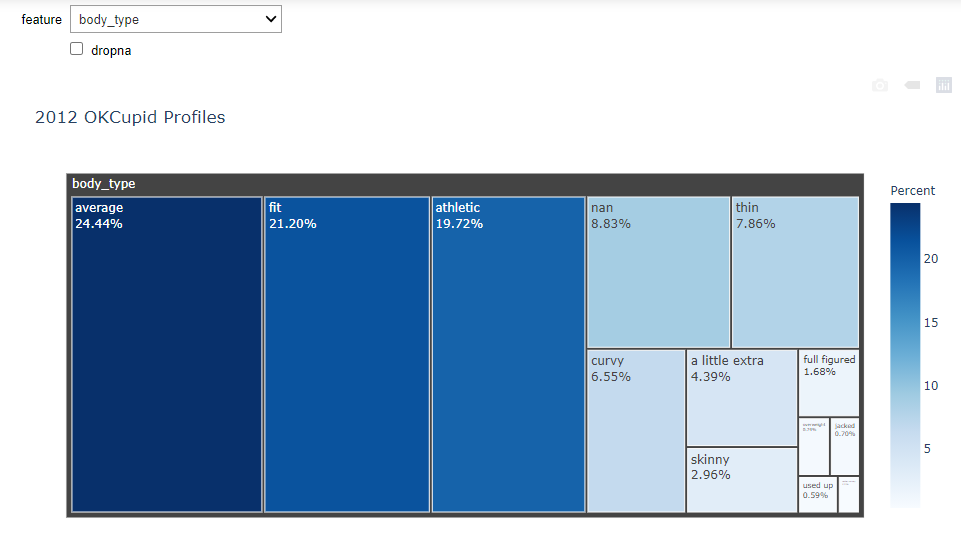

### Dashboard style donut plot grid of variables

**Nan represents unfilled/unshared optional information, signifiying that a user has not shared the
 respective information with OKCupid and it's missing from their profile
*Extrapolated or split from raw data variables


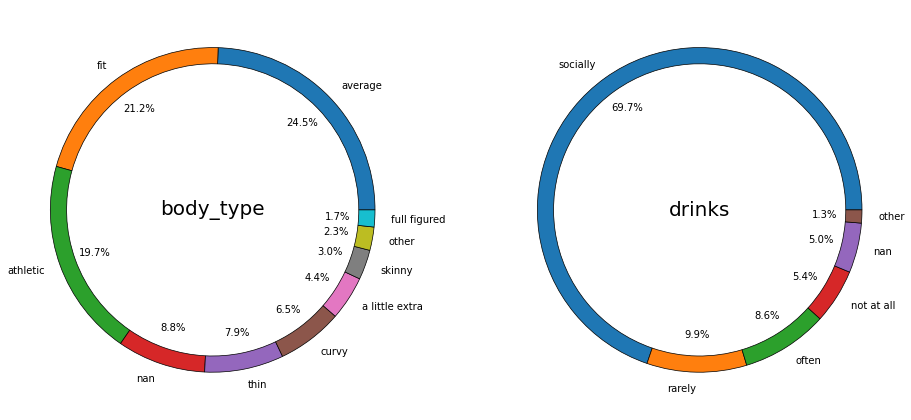

<Figure size 432x288 with 0 Axes>

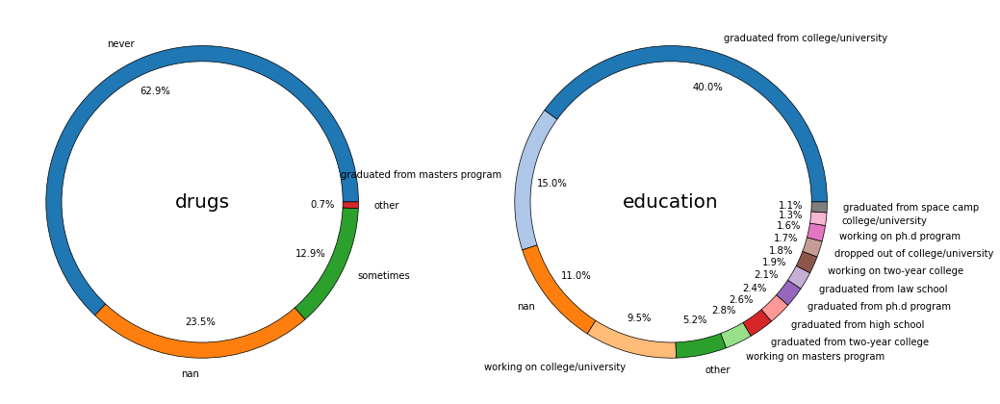

<Figure size 432x288 with 0 Axes>

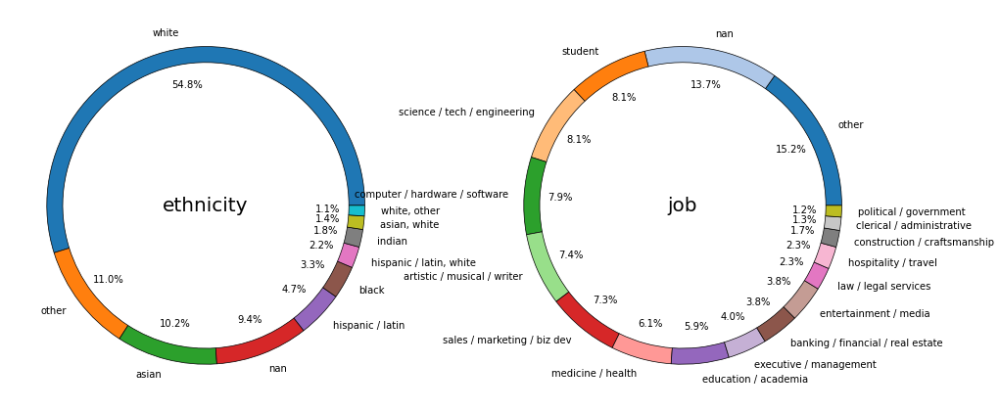

<Figure size 432x288 with 0 Axes>

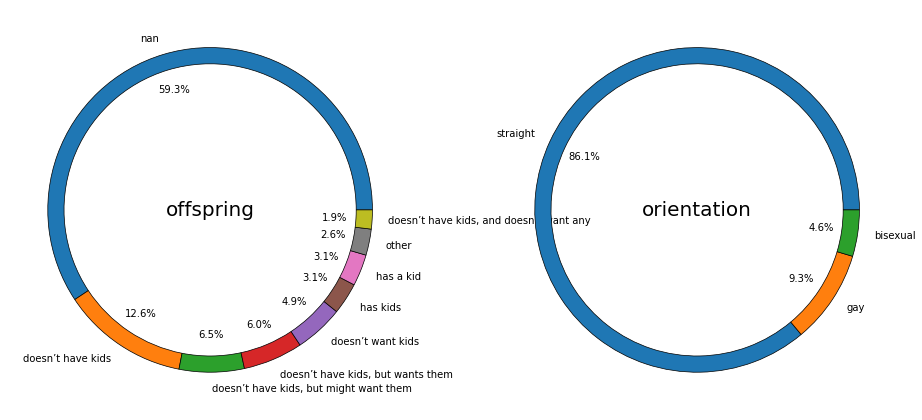

<Figure size 432x288 with 0 Axes>

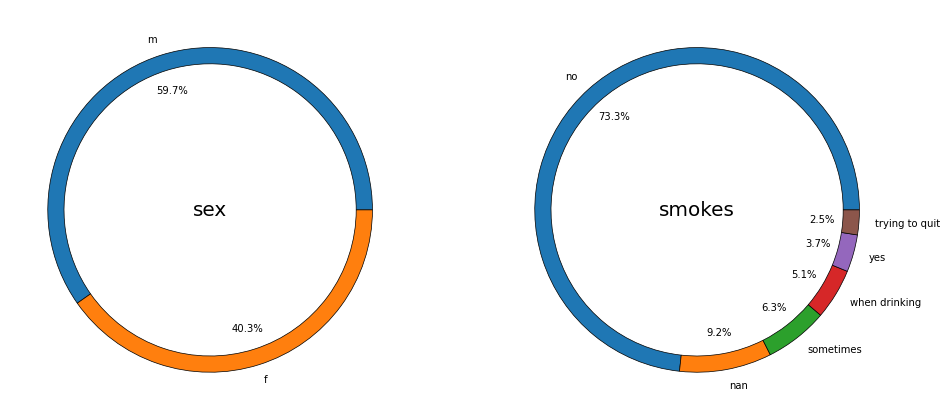

<Figure size 432x288 with 0 Axes>

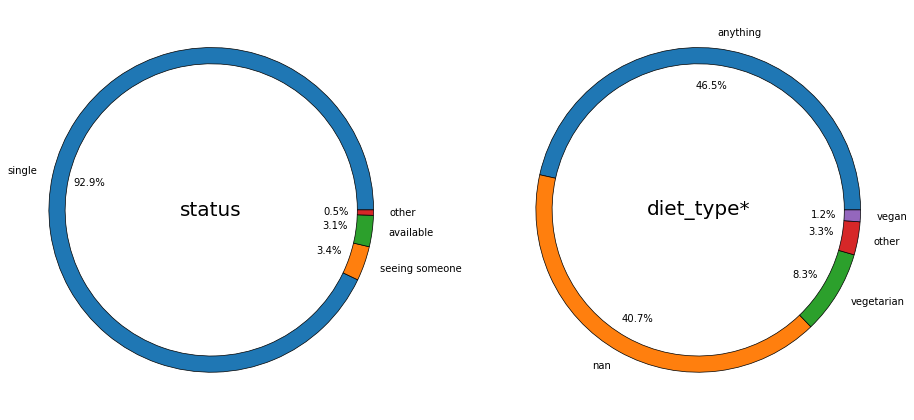

<Figure size 432x288 with 0 Axes>

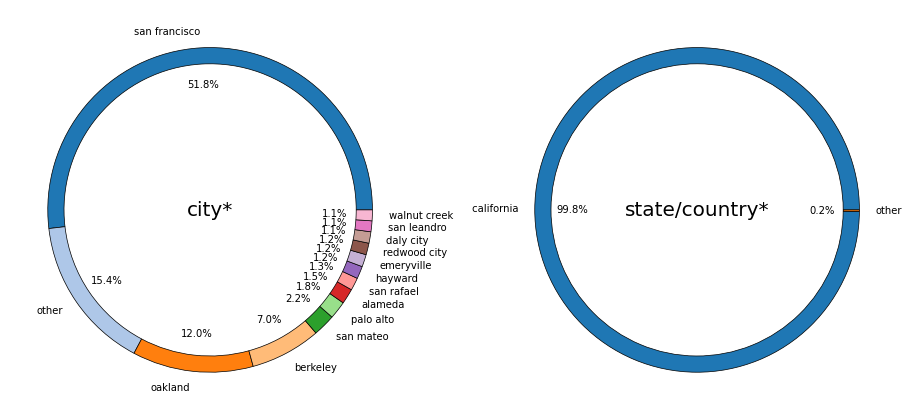

<Figure size 432x288 with 0 Axes>

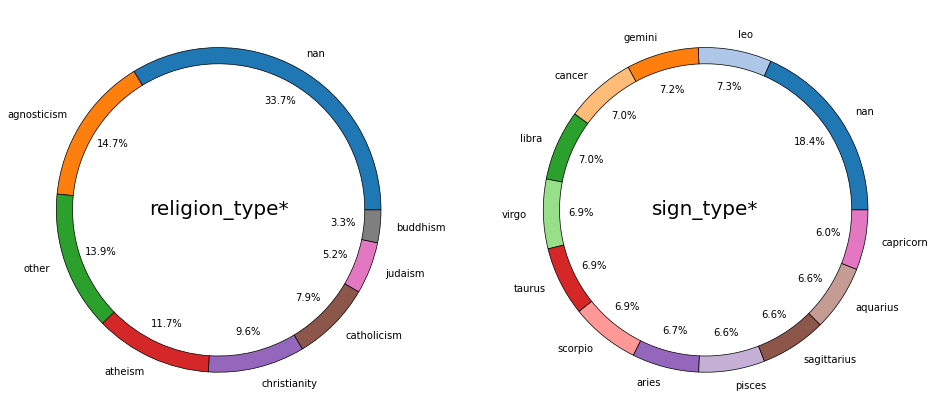

<Figure size 432x288 with 0 Axes>

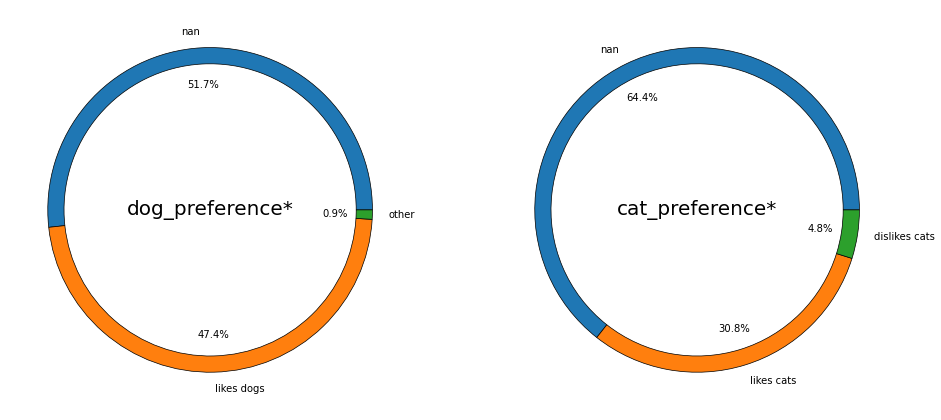

<Figure size 432x288 with 0 Axes>

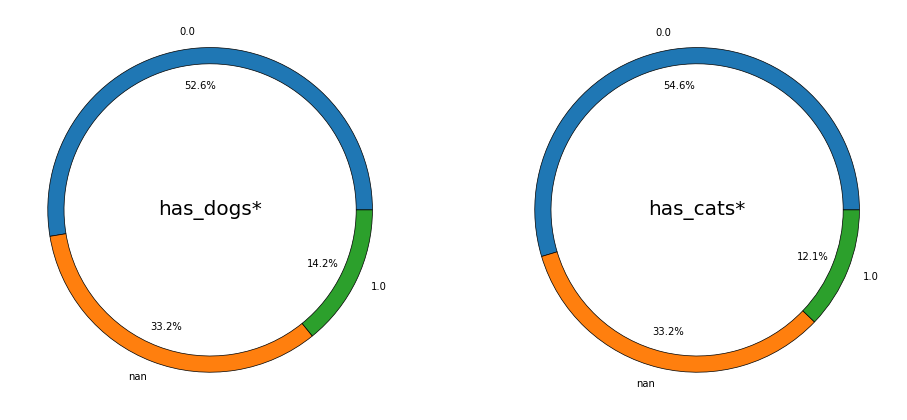

<Figure size 432x288 with 0 Axes>

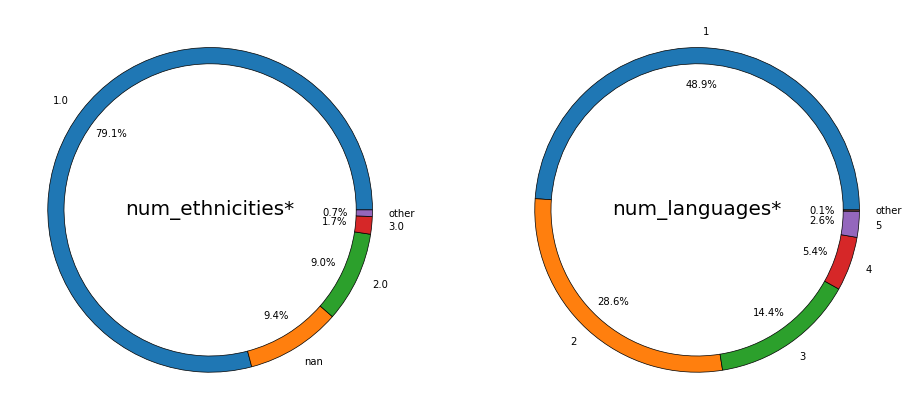

<Figure size 432x288 with 0 Axes>

In [29]:
print('**Nan represents unfilled/unshared optional information, \
signifiying that a user has not shared the\n respective information with OKCupid and it\'s missing from their profile')
print('\033[1m'+'*Extrapolated or split from raw data variables'+'\033[0m')
import matplotlib.pyplot as plt

drop = ['diet', 'diet_adherence', 'location', 'offspring_want', 'offspring_attitude', 'pets', 'religion', 'sign', 'speaks',
        'religion_attitude', 'sign_attitude', 'optional_%unfilled',
        'last_online'] + languages + ['age', 'height', 'income'] + essay_feats
for_plotting = df.drop(columns = drop).columns.to_list()
extrapolated_vars = ['diet_type', 'city', 'state/country', 'religion_type', 'sign_type',
                     'dog_preference', 'has_dogs', 'cat_preference', 'has_cats', 'num_ethnicities', 'num_languages']

def collapse_category(feat, threshold):
    '''Needed to ensure that only a mask would be used to mark categories to collapse,
    and to preserve the original data frame'''
    sum = df[feat].value_counts(dropna = False).reset_index()[feat].sum()
    temp = df[feat].copy()
    mask1 = temp.value_counts()/sum < threshold
    mask2 = temp.isin(mask1[mask1 == True].index)
    temp[mask2] = 'other'
    return temp.value_counts(dropna = False).reset_index()


for i in range(1, 12):
    plt.figure(figsize = (16, 9))
    j = 2*i
    k = j-2
    for num, feat in zip(range(1,3), for_plotting[k:j]):
        plt.subplot(1, 2, num)
        temp = collapse_category(feat, 0.01)
        labels = temp['index']
        theme = plt.get_cmap("tab20" if len(labels) > 10 else "tab10")
        plt.pie(x=temp[feat], autopct="%.1f%%", labels=labels, pctdistance=0.77,
                #radius = 1,
                colors = theme(np.arange(len(labels))),
                wedgeprops=dict(width=0.10,
                                edgecolor="k",
                                linewidth=0.7))
        text = feat + '*' if feat in extrapolated_vars else feat
        plt.text(0, 0, text, 
                 horizontalalignment = 'center',
                 verticalalignment = 'center',
                 fontsize = 20)
    plt.show()
    plt.clf()

**Bias:**

The biggest indicator that this sample does not meet the statistical criteria for independent random sampling is the 'state/country' variable. OKCupid was founded in 2004. It's simply not possible that by 2012 all of their users would only be from the state of California. When you get a dataset, regardless of what you've been told about the quality of the sampling, always check for signs of bias. The process of checking for bias in a study or in a sample is sometimes called a "Risk of Bias Assessment".

Even though the sample looks like it's heavily biased, we will still draw inference about what is represented in the sample.

**The charts tell us that the typical profile on OKCupid back in 2012 was:**
- not fat or skinny
- has drinks socially
- doesn't do drugs
- finished college
- white ethnicity
- varied in terms of possible job background
- doesn't have kids
- straight
- male
- doesn't smoke
- single
- lives in San Francisco, California
- eats anything
- agnostic or atheist
- likes dogs and/or cats but doesn't have them
- not multiracial
- speaks only one language

It's possible that people misrepresent themselves on their profile, paint themselves more positively, and carefully omit negative information.

### Top Spoken Languages

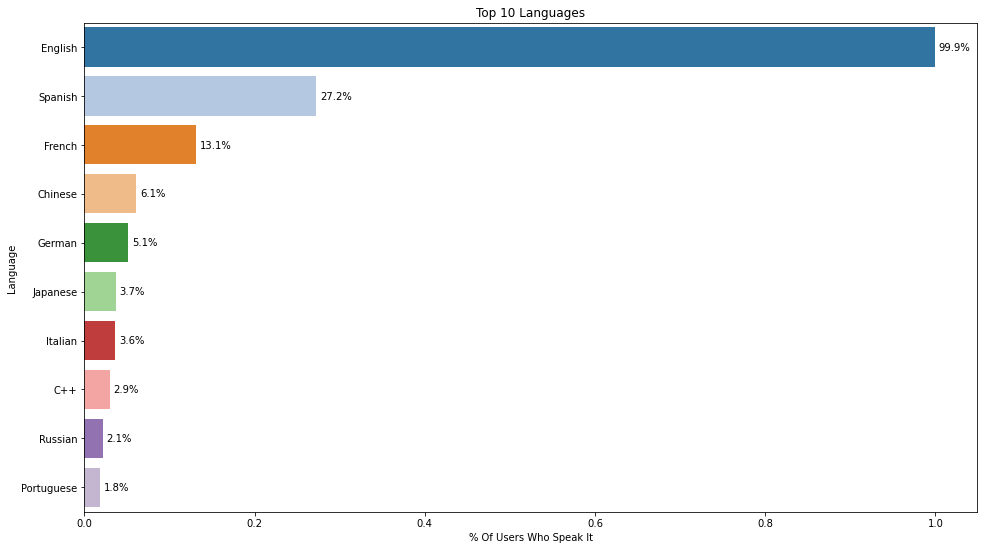

In [30]:
import seaborn as sns

lang_percent = []
for language in languages:
    lang_percent.append((language, df[language].value_counts(normalize = True).loc[1]))
    
def sort_func(pair):
    return pair[1]    
sorted_lang_percent = sorted(lang_percent, key = sort_func, reverse = True)

#Make barplot
plt.figure(figsize = (16, 9))
rects = sns.barplot(x = [each[1] for each in sorted_lang_percent[:10]],
            y = [each[0].title() for each in sorted_lang_percent[:10]], 
            orient = 'h',
            palette = "tab20")

#Add Data Labels outside of bar
rect_labels = []
for rect in rects.patches:
    yloc = rect.get_y() + rect.get_height() / 2
    label = plt.annotate(format(rect.get_width(), '.1%'), xy=(rect.get_width(), yloc), xytext=(4, 0),
                         textcoords="offset points", horizontalalignment='left', verticalalignment='center',
                         color='black', clip_on=True)
    rect_labels.append(label)

plt.title("Top 10 Languages")
plt.ylabel("Language")
plt.xlabel('% of users who speak it'.title())
plt.show()

Everyone speaks English. Hilariously some people speak C++... _why not Python?_

##  Unfilled Optional Fields Sorted

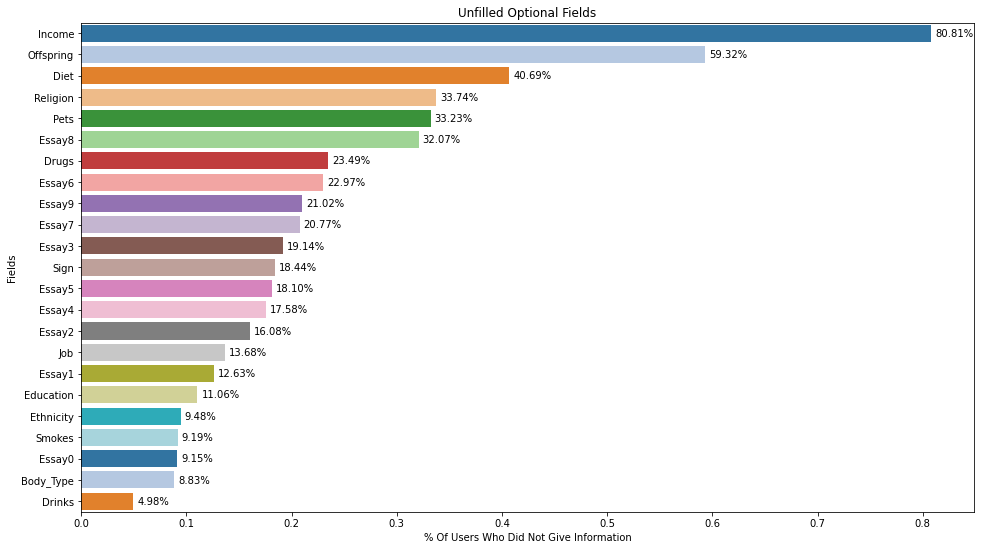

In [31]:
sorted_nulls = sorted(nulls, reverse = True)
sample_size = 59946

#Make barplot
plt.figure(figsize = (16, 9))
rects = sns.barplot(x = [each[0]/sample_size for each in sorted_nulls[:23]],
            y = [each[1].title() for each in sorted_nulls[:23]], 
            orient = 'h',
            palette = "tab20")

#Add Data Labels outside of bar
rect_labels = []
for rect in rects.patches:
    yloc = rect.get_y() + rect.get_height() / 2
    label = plt.annotate(format(rect.get_width(), '.2%'), xy=(rect.get_width(), yloc), xytext=(4, 0),
                         textcoords="offset points", horizontalalignment='left', verticalalignment='center',
                         color='black', clip_on=True)
    rect_labels.append(label)

plt.title("Unfilled Optional Fields")
plt.ylabel("Fields")
plt.xlabel('% of users who did not give information'.title())
plt.show()

**Disclaimer**: My comments below are pure speculation and hypothesis

| Feature        | Hypothesis For Not Sharing Information     |
| :------------- | :---------- |
| Income |If you're rich you don't want the IRS to know. If you're poor, you don't want potential matches to see that either|
| Children |Finding out someone has kids can be a turn off and perceived as extra baggage|
| Diet|People are afraid of being criticized for choosing to shun some foods|
|Religion|Some people are xenophobic. As a result, some people hide their religion so as not to immediately turn away those xenophobes|
|Pets| No idea why a third of users don't share this information|
|Essays| There's a pattern where the higher up the chart you go, the higher the essay number. This is because the questions are presented to the user in a fixed order. Not all users have the patience to answer questions all the way to the last one. The reason why essay 8 stands out significantly more than the rest is because the question being asked is "Share something private", which of course is rather controversial considering you can't take back what you share online. See below [section](#Interpretation-of-tf-idf-Results) for the essay questions.|
|Drugs|Drugs are illegal in some states|

## Essay Questions

The essay questions are a perfect candidate for Natural Language Processing (NLP) Topic Modelling. More specifically, we'll be using term frequency - inverse document frequency (tf-idf), a model which initially counts the occurences of each word, then applies a word weighting scheme which deprioritizes common words such as "the". The expected result is to condense the essay answers into specific keywords, which may be visualized.

Let's create a copy of all of the essay answers ,just in case we need to start over in the preprocessing for NLP.

In [32]:
nlp_essay_df = df[essay_feats].copy(deep = True)

### Text Preprocessing

Before we can apply tf-idf to our essay questions, we need to convert them to a suitable format. The process is called text preprocessing. The words of our essay questions will be converted to their root words(also called lemma).

In [33]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet as wn

from collections import Counter
import unicodedata
import string

# Lemmatizer class object - converts tokens to root words
lemmatizer = WordNetLemmatizer()
# Fetch nltk stopwords
stopwords = nltk.corpus.stopwords.words('english')

def preprocess_corpus(DataFrame, Series):
    # Remove accents function
    def remove_accents(data):
        return ''.join(x for x in unicodedata.normalize('NFKD', data) if x in string.ascii_letters or x == " ")

    # Look at synonyms of the word if it's likely to be a noun, verb, adjective, or adverb
    def get_part_of_speech(word):
        # Fetch synonyms of word from wordnet database
        probable_part_of_speech = wn.synsets(word)
        # Count the number of nouns, verbs, adjectives, and adverbs among the synonyms
        pos_counts = Counter()
        pos_counts["n"] = len(  [ item for item in probable_part_of_speech if item.pos()=="n"]  )
        pos_counts["v"] = len(  [ item for item in probable_part_of_speech if item.pos()=="v"]  )
        pos_counts["a"] = len(  [ item for item in probable_part_of_speech if item.pos()=="a"]  )
        pos_counts["r"] = len(  [ item for item in probable_part_of_speech if item.pos()=="r"]  )
        # Get the speech type with the highest count and return it
        most_likely_part_of_speech = pos_counts.most_common(1)[0][0]
        return most_likely_part_of_speech

    # Convert each word into its lemma(root word)
    def preprocess_text(text, min_word_length):
        # Tokenize
        tokens = nltk.word_tokenize(text)
        # Convert to lowercase
        tokens = [token.lower() for token in tokens]
        # Remove accents
        tokens = [remove_accents(token) for token in tokens]
        # Remove punctuations
        tokens = [str(token).translate(string.punctuation) for token in tokens]
        tokens = [token for token in tokens if token != '']
        # Remove stopwords
        tokens = [token for token in tokens if token not in stopwords]
        # Remove short words
        tokens = [token for token in tokens if len(token) >= min_word_length]
        # Lemmatize
        lemmas = " ".join([lemmatizer.lemmatize(token, get_part_of_speech(token)) for token in tokens])
        return lemmas
    
    # Convert Data Series to a List 
#     list_corpus = DataFrame[Series].dropna().to_list()
    list_corpus = DataFrame[Series].to_list()
    # Remove linebreaks
    list_corpus = [" ".join(text.splitlines(False)) if isinstance(text, str) else ' ' for text in list_corpus ]
    # Remove '/' characters
    list_corpus = [text.replace('/', ' ') if isinstance(text, str) else ' ' for text in list_corpus]
    #Normalize
    processed_corpus = [preprocess_text(text, 3) if isinstance(text, str) else ' ' for text in list_corpus]
    return processed_corpus

### Term Frequency-Inverse Document Frequency

Now that we have our root words, let's apply tf-idf. It will assign a score to each root word. For each user's answer we will get the highest scoring word (keyword). This keyword represents what our model believes is the most significant word of a user's response.

In [34]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Tfidf class object - Scores each word
vectorizer = vectorizer = TfidfVectorizer()

def tfidf_for_keywords(processed_corpus):
    '''Generates one keyword for each document in the corpus. Returns all keywords as a list.'''
    tfidf_scores = vectorizer.fit_transform(processed_corpus)
    feature_names = vectorizer.get_feature_names()
    keywords = [feature_names[row.argmax()] for row in tfidf_scores]
    return keywords, tfidf_scores, feature_names

### Iterate over all essay columns

Let's iterate the whole process over all of our essay features, and let's collect only the most common keywords.

In [35]:
essay_vectors = []
essay_feature_names = []
def series_to_keywords(DataFrame, Series, n_top, export_vectors = False):
    processed_corpus = preprocess_corpus(DataFrame, Series)
    keywords, tfidf_scores, feature_names = tfidf_for_keywords(processed_corpus)
    essay_vectors.append(tfidf_scores)
    essay_feature_names.append(feature_names)
#     temp = DataFrame[Series].dropna().reset_index()
    temp = DataFrame[Series].reset_index()
    temp[str(Series) + '_keywords'] = keywords 
    if export_vectors:
        temp[str(Series) + '_keywords'].value_counts().iloc[:n_top].to_csv(str(Series) + '_top_keys.csv')

# for feature in essay_feats:
#     series_to_keywords(nlp_essay_df, feature, 40)

In [36]:
# essay_vectors[2].get_shape()

### Top Keywords in User Responses to Essay Questions Visualized as Wordclouds

Let's generate wordclouds for each of the essay questions. <br>
_Developer Note: The code is embedded as an image because it was run in a separate Python 3.7 environment._

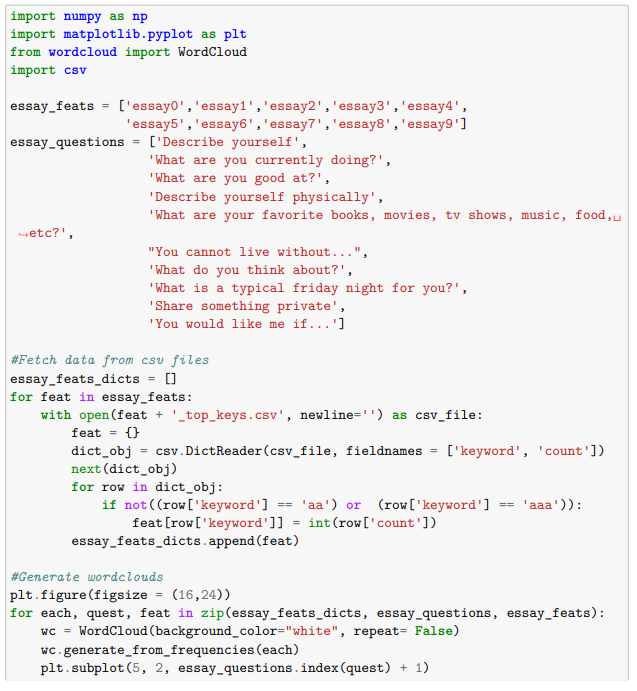

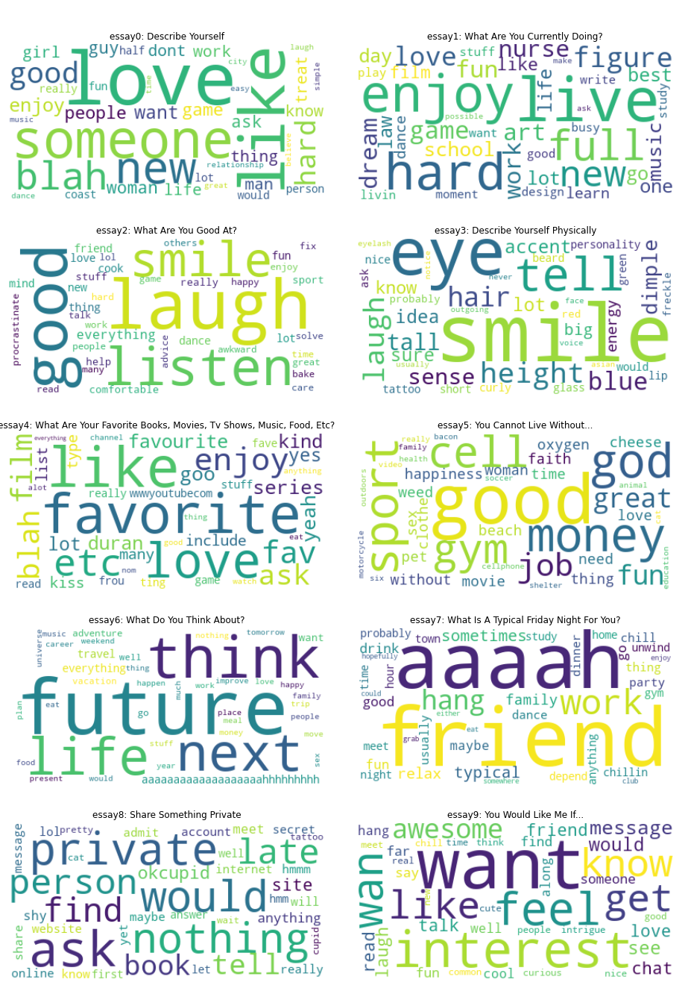

The level of insight gained from each wordcloud, using the existing model algorithm, is not the same. Some give sufficiently interesting and useful results. Some tell us more about what essay question is being asked rather than what the answers to those questions are. The results merit further filtering, tweaking, and refinement of the algorithm to give us better keywords. Further NLP modelling and analysis deserves to be discussed in its own lengthy separate article/notebook. We will not explore it further here.

In addition to the wordclouds, manual reading of several user responses was done to better interpret the tf-idf results.

### Interpretation of tf-idf Results

|Essay Number| Personal best guess of the question asked| Comment on tf-idf Result|
| :------------- | :---------- | :---------- |
|essay 0| Describe yourself| Users use this essay question to talk about what they like, love, and the qualities of who(someone) they're looking for|
|essay 1| What are you currently doing?| A lot of the smaller words are clear answers to the question while the biggest words are a little bit more difficult to interpret or could be weighted to have a lower score| 
|essay 2| What are you good at?| Users say they're good at listening and that they have a great smile and laugh|
|essay 3| Describe yourself physically| Users talk about their eyes, hair, smile, and height|
|essay 4|What are your favorite books, movies, tv shows, music, food, etc | Not a very meaningful result. More useful for guessing the essay question.|
|essay 5| You can't live without...|Users cannot live without their cellphone, money, gym, job, god, sports, fun. Not sure though what it means that 'good' is top keyword|
|essay 6| What do you think about?| Users think about life and the future|
|essay 7| What is a typical friday night for you?| Users are with their friends on friday nights|
|essay 8| Share something private| Users say 'message/ask me about private things and ill share it with you, but I won't share it here on my public profile'. From the previous section, we can also see that this is the least answered essay question.|
|essay 9| You would like me if...| Doesn't seem like a very meaningful result|

### Further NLP Practice

There is still additional NLP analysis that we will not explore here but can definitely be applied. For example, we can see in essay0 the top keywords are 'love' and 'like'. _What do users really mean when they use the word 'love'? Is it 'making love' or 'looking for love'? Are they using 'love' and 'like' interchangeably?_

Additional NLP:
- Filter keywords by Part of Speech (noun, adjective, verb, adverb)
- Contextualize keywords by investigating the words which follow and precede them
- Make use of n-grams instead of one-word terms. The terms in our tf-idf model are one word long, but we can also use pairs of words, or groups of three words, and even more. You could also try skip-grams.
- Make use of other Word Embedding Models, an AI model that maps words into vectors. Tf-idf was only one example of a simple word embedding model. Each element of the vector could be different properties of the word, such as its part of speech, number of syllables, number of vowels, number of consonants, what word follows it, what word precedes it, location of the word in the paragraph, and much more. 
- Input the tf-idf results to a Latent Dirichlet Allocation (LDA) Model. Manually assign labels to your LDA topics. Plot the most common topics in the corpus, as well as the most common words per topic,  from your LDA result.

## Visualization Recap

**In this section, we visualized the following:**
- We visualized our numerical features using box plots and histograms
- We made an interactive treemap of our categorical features
- We visualized our categorical features using donut plots
- Using bar plots we visualized the top spoken languages and top unfilled optional fields among user profiles
- We visualized the essay question responses using Natural Language Processing and wordclouds

**From our Numerical Features we learned:**

| Feature        | Comment      |
| :------------- | :---------- |
| Age | The median age is 30. The distribution is right-skewed. Most users are young and working adults.|
|  Height        | Most heights range between 59 and 78 in (4.9 - 6.5 ft) with a median of 68in(5.67ft). The distribution appears normal. |
|  Income        | The median income is \\$50k. A quarter of all incomes are $25k. Most income distributions are log-normal (if the ultra-wealthy are not included), and this is no different. |
|optional_%unfilled| Half of all users don't bother to fill 12% - 30% of optional fields. A quarter of users are below that range and a quarter of users are above that range.|

**From our Categorical Features we learned the stereotypical profile is:**
- not fat or skinny
- has drinks socially
- doesn't do drugs
- finished college
- white ethnicity
- varied in terms of possible job background
- doesn't have kids
- straight
- male
- doesn't smoke
- single
- lives in San Francisco, California
- eats anything
- agnostic or atheist
- likes dogs and/or cats but doesn't have them
- not multiracial
- speaks only one language

We also discovered that our sample has a high risk of bias. In our sample data which is dated from 2012, although OKCupid was founded in 2004, practically everyone lives in California and half of that in the City of San Francisco.

**With the use of bar plots we learned:**
- Everyone speaks English
- Among the information users don't want to share, 'income' is the highest, with an 80% overwhelming majority, followed by 'offspring'(whether they have children) at 60%.

**From our Essay Features we learned:**

|Essay Number| Personal best guess of the question asked| Comment on tf-idf Result|
| :------------- | :---------- | :---------- |
|essay 0| Describe yourself| Users use this essay question to talk about what they like, love, and the qualities of who(someone) they're looking for|
|essay 1| What are you currently doing?| A lot of the smaller words are clear answers to the question while the biggest words are a little bit more difficult to interpret or could be weighted to have a lower score| 
|essay 2| What are you good at?| Users say they're good at listening and that they have a great smile and laugh|
|essay 3| Describe yourself physically| Users talk about their eyes, hair, smile, and height|
|essay 4|What are your favorite books, movies, tv shows, music, food, etc | Not a very meaningful result. More useful for guessing the essay question.|
|essay 5| You can't live without...|Users cannot live without their cellphone, money, gym, job, god, sports, fun. Not sure though what it means that 'good' is the top keyword|
|essay 6| What do you think about?| Users think about life and the future|
|essay 7| What is a typical friday night for you?| Users are with their friends on friday nights|
|essay 8| Share something private| Users say 'message/ask me about private things and ill share it with you, but I won't share it here on my public profile'. From the previous section, we can also see that this is the least answered essay question.|
|essay 9| You would like me if...| Doesn't seem like a very meaningful result|

**In this section, we made the decision to strip outliers of _age_ and _height_:**<br><br>
Outliers have the potential to increase memory usage, variance, and training time. The current objective is to make a predictive model that works. If that objective is accomplished, we have the option of reiterating on this project to incorporate outliers.

# Feature Engineering Part 2

We need to do even more feature engineering before we go into Machine Learning. All our features have to be properly formatted and expanded/encoded. Any value that is not a number will not be understood by our ML training algorithm.

We will make a backup copy of our data at this point, so that we can reset back to this checkpoint if we want to undo any modifications. Let's also drop our languages sparse matrix. Previously we didn't include the fluency descriptors in our sparse matrix for our visualization. Later, when one-hot encoding, we will make a new sparse matrix for languages which contains the fluency descriptors.

In [37]:
expanded_df_backup = df.drop(columns = languages).copy(deep = True)

In [38]:
df = expanded_df_backup.copy(deep=True)

Let's convert *last_online* from a string to a datetime format and split it up.

In [39]:
df['last_online'] = pd.to_datetime(df.last_online, format = "%Y-%m-%d-%H-%M")
df['last_online_year'] = df.last_online.dt.year
df['last_online_month'] = df.last_online.dt.month
df['last_online_day'] = df.last_online.dt.day
df['last_online_hour'] = df.last_online.dt.hour

Let's drop columns that we have created splits from. If we need to use them as target variables for prediction we can recover any of them from our backup dataframe. Let's drop _income_ because 80% of it's values are missing. Let's also drop _num_ethnicities_ and _optional__%unfilled_.

In [40]:
df = df.drop(columns = ['diet', 'location', 'offspring', 'religion', 'sign', 'pets', 'income', 'last_online',
                        'num_ethnicities', 'optional_%unfilled'])

Let's apply one-hot encoding to our categorical variables. We will also encode a category to represent the null values of each feature, so that our ML model will include the user's decisions to share particular information when making predictions.

In [41]:
print('Before one-hot encoding:')
df.info()

Before one-hot encoding:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 59811 entries, 0 to 59945
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 59811 non-null  int64  
 1   body_type           54538 non-null  object 
 2   drinks              56846 non-null  object 
 3   drugs               45755 non-null  object 
 4   education           53211 non-null  object 
 5   essay0              54351 non-null  object 
 6   essay1              52275 non-null  object 
 7   essay2              50210 non-null  object 
 8   essay3              48375 non-null  object 
 9   essay4              49318 non-null  object 
 10  essay5              49010 non-null  object 
 11  essay6              46085 non-null  object 
 12  essay7              47404 non-null  object 
 13  essay8              40636 non-null  object 
 14  essay9              47245 non-null  object 
 15  ethnicity           54159 no

In [42]:
df = pd.get_dummies(df, columns = ['body_type', 'drinks', 'drugs', 'education', 'job', 'orientation', 'sex',
                                           'smokes', 'status', 'diet_adherence', 'diet_type', 'city', 'state/country',
                                           'offspring_want', 'offspring_attitude', 'religion_type', 'religion_attitude', 
                                           'sign_type', 'sign_attitude', 'dog_preference', 'cat_preference', 'has_dogs',
                                           'has_cats',], 
                    sparse=True,
                    dummy_na=True)

df.rename(columns = {'sex_m':'sex'}, inplace = True)
df = df.drop(columns = ['sex_f'])

def string_dummies(df, series, sep):
    if df[series].isna().any():
        df[series + '_nan'] = df[series].isna().astype('int64')
    temp_df = df[series].str.get_dummies(sep).add_prefix(str(series) + '_')
    df = pd.concat([df, temp_df], axis = 1)
    return df.drop(columns = [str(series)])

selection = ['ethnicity', 'speaks']
sep_list = [', ', ', ']
for series, sep in zip (selection, sep_list):    
    df = string_dummies(df, series, sep)

In [43]:
print('After one-hot encoding:')
df.info()

After one-hot encoding:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 59811 entries, 0 to 59945
Columns: 737 entries, age to speaks_yiddish (poorly)
dtypes: Sparse[uint8, 0](407), float64(1), int64(319), object(10)
memory usage: 157.5+ MB


Let's make our dataframe have uniform datatypes. Just ignore the datatype of the essays for now (the ten object coumns).

In [44]:
df['height'] = df.height.astype('int64')
for each in df.select_dtypes(include=['int64']).columns.to_list():
    df[each] = pd.arrays.SparseArray(df[each].values, dtype='uint8')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59811 entries, 0 to 59945
Columns: 737 entries, age to speaks_yiddish (poorly)
dtypes: Sparse[uint8, 0](727), object(10)
memory usage: 14.3+ MB


We are now ready to move on to Machine Learning.

## Feature Engineering Part 2 Recap

In this Section we accomplished the following:
* Converted _last_online_ into datetime format and split it up by hour, day, year, month
* Dropped columns that, for various reasons, we will not include in the Machine Learning Section
* Applied one-hot encoding to our categorical features
* Converted the datatypes of our dataframe to become uniform, specifically they are now Sparse[uint8, 0]

# Machine Learning to Predict Gender

We will evaluate and compare two different Machine Learning Models to predict gender.

Now is a good time to backup the dataframe.

In [45]:
sparse_essay_df = df.copy(deep = True)

In [46]:
def feature_selection_to_list(df, cat_selection, numeric_selection):
    categorical_feats = []
    for each in cat_selection:
        categorical_feats = categorical_feats + df.loc[:, df.columns.str.startswith(each)].columns.to_list()
    return categorical_feats + numeric_selection

## Gender Classification with a Logistic Regression Model

In [47]:
from sklearn.linear_model import LogisticRegression
from scipy.sparse import coo_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go

def model_with_logistic_regression(feature_selection, target_selection, predictor_legend, use_csr_feats = False,
                                  swap_legend_colors = False):
    #Select predictors and target
    predictors = sparse_essay_df[feature_selection].sparse.to_dense()
    if use_csr_feats:
        predictors = predictors.sparse.to_coo()
        predictors = predictors.tocsr()
    target = sparse_essay_df[target_selection]

    X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size = 0.2)

    # Scale the feature data so it has mean = 0 and standard deviation = 1
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Create and train the model
    model = LogisticRegression()
    model.fit(X_train, y_train)

    print('Train score: ' + str(model.score(X_train, y_train)))
    print('Test score: ' + str(model.score(X_test, y_test)))

    # Analyze the predictor coefficients
    if swap_legend_colors:
        colors = [predictor_legend[1] if c > 0 else predictor_legend[0] for c in model.coef_[0]]
    else:
        colors = [predictor_legend[0] if c > 0 else predictor_legend[1] for c in model.coef_[0]]

    fig = px.bar(
        y=predictors.columns,
        x=abs(model.coef_[0]), 
        color=colors,
        color_discrete_sequence=['red', 'blue'],
        labels=dict(x='Predictor', y='Linear coefficient'),
        title='Top 20 predictors',
    )
    fig.update_yaxes(categoryorder = "total ascending", range=(len(predictors.columns) - 20.6, len(predictors.columns)))
    fig.show()

cat_selection = ['body_type', 'drinks', 'drugs', 'education', 'job', 'orientation',
                'smokes', 'status', 'diet_adherence', 'diet_type', 'last_online',
                'offspring_want', 'offspring_attitude', 'religion_type', 'religion_attitude', 
                'sign_type', 'sign_attitude', 'dog_preference', 'cat_preference', 'has_dogs',
                'has_cats', 'ethnicity', 'speaks']
numeric_selection = ['age', 'height']
feature_selection = feature_selection_to_list(sparse_essay_df, cat_selection, numeric_selection)
predictor_legend = ['Male Predictor', 'Female Predictor']
model_with_logistic_regression(feature_selection, target_selection = 'sex', use_csr_feats = False, predictor_legend = predictor_legend)

Train score: 0.8937050660424678
Test score: 0.8873192343057762


*Height* and *body_type_curvy* are our top predictors. Probably because men are taller than women on average, and because men are not likely to describe themselves as curvy whereas women are.

**AI Ethics:** A model like this highlights the ethical consideration we must take when developing AI. For example, one of the predictors is *job_computer / hardware / software*. This could be misused to discriminate by gender, proclaiming that one gender is not fit for working in a technical computer job. **Never be hasty to deploy a model that will be used on people.**

## Gender Classification with a Decision Tree Model

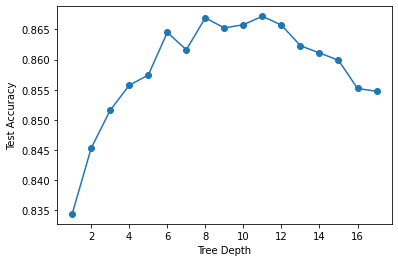

The best result is attained when the Decision Tree Model is stopped at a tree depth of 10, providing a test accuracy of 86.72%


In [48]:
from sklearn.tree import DecisionTreeClassifier

dec_tree_df = sparse_essay_df.copy()

cat_selection = ['body_type', 'drinks', 'drugs', 'education', 'orientation',
                'smokes', 'status', 'diet_adherence', 'diet_type', 'job', 'last_online',
                'offspring_want', 'offspring_attitude', 'religion_attitude', 'religion_type', 
                'sign_type', 'sign_attitude', 'dog_preference', 'cat_preference', 'has_dogs',
                'has_cats', 'ethnicity', 'speaks']
numeric_selection = ['age', 'height']
feature_selection = feature_selection_to_list(dec_tree_df, cat_selection, numeric_selection)

target = dec_tree_df['sex']
predictors = dec_tree_df[feature_selection]

train_data, test_data, train_labels, test_labels = train_test_split(predictors, target)

scores = []
for i in range(1, 18):
  tree = DecisionTreeClassifier(max_depth = i)
  tree.fit(train_data, train_labels)
  score = tree.score(test_data, test_labels)
  scores.append(score)

plt.plot(range(1, 18), scores, marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Test Accuracy')
plt.show()
print("The best result is attained when the Decision Tree Model is stopped at a tree depth of {}, providing a test accuracy of {:.2f}%".format(scores.index(max(scores)), max(scores)*100))

## Machine Learning to predict Gender Recap

In this section we accomplished the following:
* Trained a Logistic Regression model to predict gender with an accuracy of about 89%
    * *height* and *body_type_curvy* were the top predictors of gender
* Trained a Decision Tree model to predict gender with an accuracy of about 86%

# Date Recommendation using K-Means Clustering

Clustering, is a technique which groups similar data points together. Let's use this to group similar people together and recommend who you should date. People in the same cluster as you are the people who we will recommend.

## Feature Selection

We start by reviewing the features we have on hand. Which, among the features, would you want your date to have in common with you?

In [49]:
expanded_df_backup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59811 entries, 0 to 59945
Data columns (total 48 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 59811 non-null  int64  
 1   body_type           54538 non-null  object 
 2   diet                35481 non-null  object 
 3   drinks              56846 non-null  object 
 4   drugs               45755 non-null  object 
 5   education           53211 non-null  object 
 6   essay0              54351 non-null  object 
 7   essay1              52275 non-null  object 
 8   essay2              50210 non-null  object 
 9   essay3              48375 non-null  object 
 10  essay4              49318 non-null  object 
 11  essay5              49010 non-null  object 
 12  essay6              46085 non-null  object 
 13  essay7              47404 non-null  object 
 14  essay8              40636 non-null  object 
 15  essay9              47245 non-null  object 
 16  ethn

After asking someone which features they would want to have in common with them, the chosen features are:
* Drugs
* Diet
* Pets
* Orientation
* Religion (attitude only)

Let's isolate that subset of features.

In [50]:
clustering_df = sparse_essay_df.copy()
cat_selection = ['drugs', 'orientation',
                'diet_adherence', 'diet_type','religion_attitude', 'dog_preference', 'cat_preference', 'has_dogs',
                'has_cats']
numeric_selection = []
feature_selection = feature_selection_to_list(clustering_df, cat_selection, numeric_selection)
clustering_df = clustering_df[feature_selection]

#Conversion to Scipy csr_matrix
clustering_coo = clustering_df.sparse.to_coo()
clustering_csr = clustering_coo.tocsr()
clustering_csr.get_shape()

(59811, 37)

## Choosing a value of k

Now that we have our subset let's search for the best number of k clusters to use in our model.

In [51]:
#Recommended setting for training Kmeans on Windows
import os
os.environ["OMP_NUM_THREADS"] = "1"

from sklearn.cluster import KMeans

execute = False
if execute:
    num_clusters = list(range(1,200))
    inertias= []
    for i in num_clusters:
      model = KMeans(n_clusters = i)
      model.fit(clustering_csr)
      inertias.append(model.inertia_)

    plt.plot(num_clusters, inertias, '-o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.show()

The Inertia vs k graph we now have below took 5 hours to produce (hence the default setting above to skip execution of the code snippet). Inertia, is a metric which represents how spaced out the points of a cluster are relative to its centroid. A line has been drawn over the tail end of the graph so that we can clearly mark where the graph becomes linear. The specific point where the graph becomes linear is known as the elbow point, and is the number of clusters that we should use.

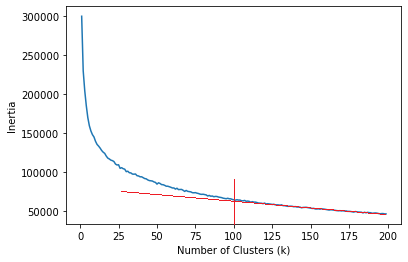

k = 100 is where the linearity begins. Let's create the model we will use for clustering with k = 100.

In [52]:
model = KMeans(n_clusters = 100)
model.fit(clustering_csr)
labels = model.predict(clustering_csr)

Let's investigate the uniformity of our cluster distribution.

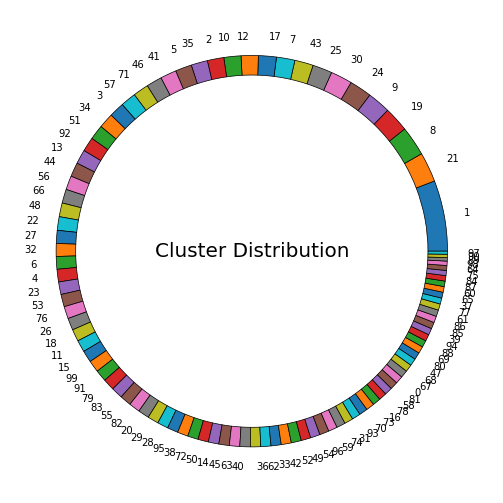

In [53]:
ser_labels  = pd.Series(labels)
ser_labels_props = ser_labels.value_counts()
plt.figure(figsize = (16,9))
plt.pie(x=ser_labels_props.values, labels = ser_labels_props.index,
                wedgeprops=dict(width=0.10,
                                edgecolor="k",
                                linewidth=0.7))
plt.text(0, 0, 'Cluster Distribution', 
                 horizontalalignment = 'center',
                 verticalalignment = 'center',
                 fontsize = 20)
plt.show()

The clusters are somewhat distributed across users. 

## Date Match Recommendations (only interactive if opened with Jupyter Notebooks and required packages are installed)

Let's discover who you can date! Select from the dropdown lists to enter your information. Click the 'Run Interact' button to predict your cluster number and display the profile of a potential date. Your cluster contains users that are similar to you - someone you might want to date! Click Run to see another random profile from your cluster.

* Note that as an experiment, null values have been included as their own category. The model groups people who similarly leave a lot of fields blank. The values of 'nan' or 'None' or 'No Prefix' means that you are not sharing information for that particular field. Go ahead and try out 'nan' and see how that affects your matches.

In [54]:
from ipywidgets import interact_manual
import random

def make_profile(sex, drugs, orientation, diet_adherence, diet_type, religion_attitude,
                 dog_preference, cat_preference, has_dogs, has_cats, show_same_gender):
    
    user_info = [drugs, orientation, diet_adherence, diet_type, religion_attitude,
                 dog_preference, cat_preference, has_dogs, has_cats]
    user_dict = {}
    for each in clustering_df.columns.to_list():
         user_dict[each] = [0]
    for each in user_info:
        user_dict[each] = [1]
    user_df = pd.DataFrame(data=user_dict, index = ['You'])
    sparse_user_df = user_df.copy()
    for each in sparse_user_df.columns.to_list():
        sparse_user_df[each] = pd.arrays.SparseArray(sparse_user_df[each].values, dtype='uint8')
        
    sparse_user_df = sparse_user_df.sparse.to_coo()
    sparse_user_df = sparse_user_df.tocsr()
    
    user_cluster_label = model.predict(sparse_user_df)
    user_cluster = np.where(labels == user_cluster_label)[0]
    print("Your cluster is {}.\nThere are {} users in your cluster.".format(user_cluster_label, len(user_cluster)))
    
    if show_same_gender == False:
        user_sex_dict = {'Male':'m', "Female":'f'}
        user_sex = user_sex_dict[sex]
        #Look for an opposite gender
        while user_sex == user_sex_dict[sex]:
            rand_index = random.randint(0, len(user_cluster))
            rand_user = user_cluster[rand_index]
            user_sex = expanded_df_backup.iloc[rand_user]['sex']
    else:
        rand_index = random.randint(0, len(user_cluster))
        rand_user = user_cluster[rand_index]       

    print("Is this person dateable? Press Run again to see a new recommendation.\n")
    show_user_data(expanded_df_backup.iloc[:,0:31], rand_user)

interact_manual(
    make_profile,
    sex = ['Male', 'Female'],
    drugs = feature_selection_to_list(clustering_df, ['drugs'], []),
    orientation = feature_selection_to_list(clustering_df, ['orientation'], []),
    diet_adherence = feature_selection_to_list(clustering_df, ['diet_adherence'], []),
    diet_type = feature_selection_to_list(clustering_df, ['diet_type'], []),
    religion_attitude = feature_selection_to_list(clustering_df, ['religion_attitude'], []),
    dog_preference = feature_selection_to_list(clustering_df, ['dog_preference'], []),
    cat_preference = feature_selection_to_list(clustering_df, ['cat_preference'], []),
    has_dogs = feature_selection_to_list(clustering_df, ['has_dogs'], []),
    has_cats = feature_selection_to_list(clustering_df, ['has_cats'], []),
    show_same_gender = True
)

interactive(children=(Dropdown(description='sex', options=('Male', 'Female'), value='Male'), Dropdown(descript…

<function __main__.make_profile(sex, drugs, orientation, diet_adherence, diet_type, religion_attitude, dog_preference, cat_preference, has_dogs, has_cats, show_same_gender)>

### Static Image Preview
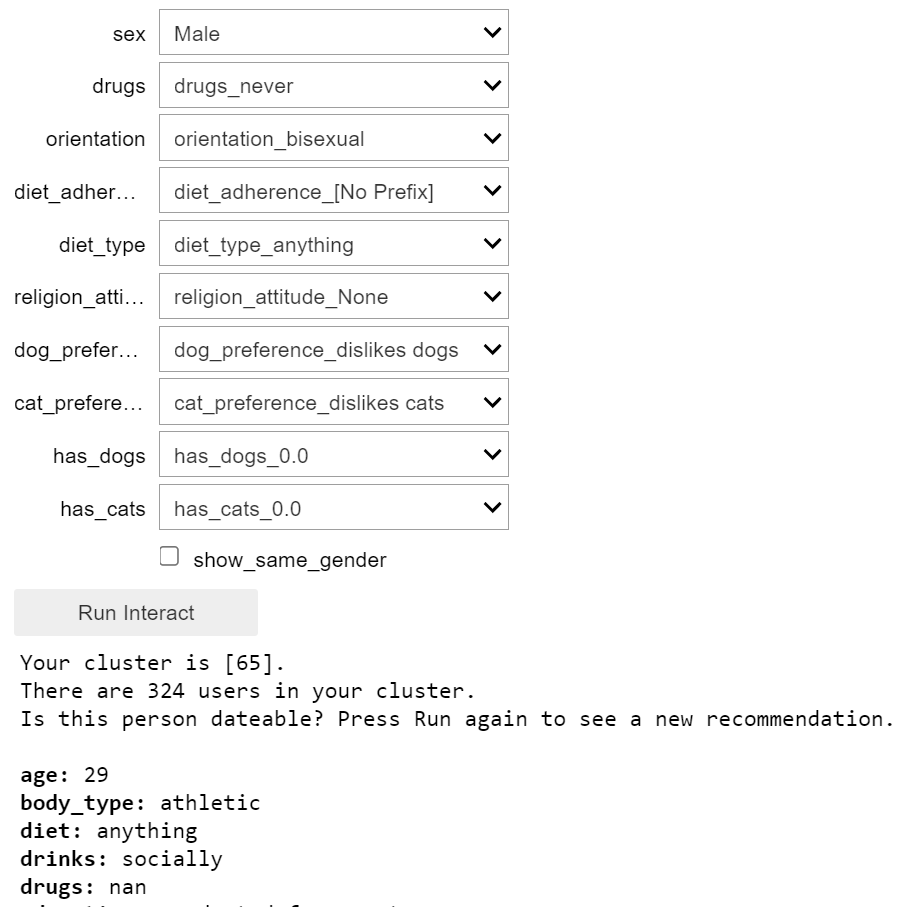

## Date Recommendation using K-Means Clustering Recap

In this section, we accomplished the following:
* Selected features for our model, on the basis of wanting a potential date to be similar for those particular features
* Used the 'elbow method' for selecting a value of k for our k-means clustering model
* Created an interactive interface for presenting profiles of suggested users to date based on input user data

# You've reached the end of this article. Thanks for reading it!